<h1 style="color:blue"> Part (1) </h1>

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import cv2
from skimage.io import imsave, imread

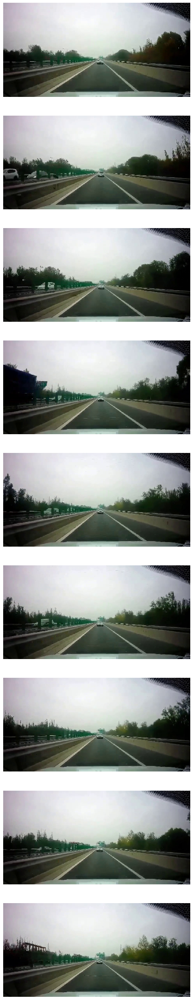

In [73]:
test_images = []
test_titles = []
for filename in os.listdir('./test_images'):
    if "jpg" in filename or "jpeg" in filename:
        test_images.append(plt.imread('./test_images/'+filename))
        test_titles.append(filename)
number_of_images = len(test_images)
fig, axs = plt.subplots(number_of_images, 1)
fig.set_figwidth(40)
fig.set_figheight(40)
for idx, ax in enumerate(axs):
    ax.imshow(test_images[idx])
    ax.axis(False)

In [36]:

def rgb_to_hsi(rgb_pixel):
    red, green, blue = rgb_pixel/256.0
    intensity = min(red, green, blue)
    saturation = 1 - (3*min(red, green, blue)/(red+green+blue + 0.0001))
    denominator = np.sqrt(((red-green)**2 + (red-blue)*(green-blue)))
    denominator = 1 if denominator == 0 else denominator
    theta = math.acos((0.5*(2*red - green- blue))/ denominator)
    hue = theta if blue <= green else 2*math.pi - theta
    return [hue, saturation, intensity]

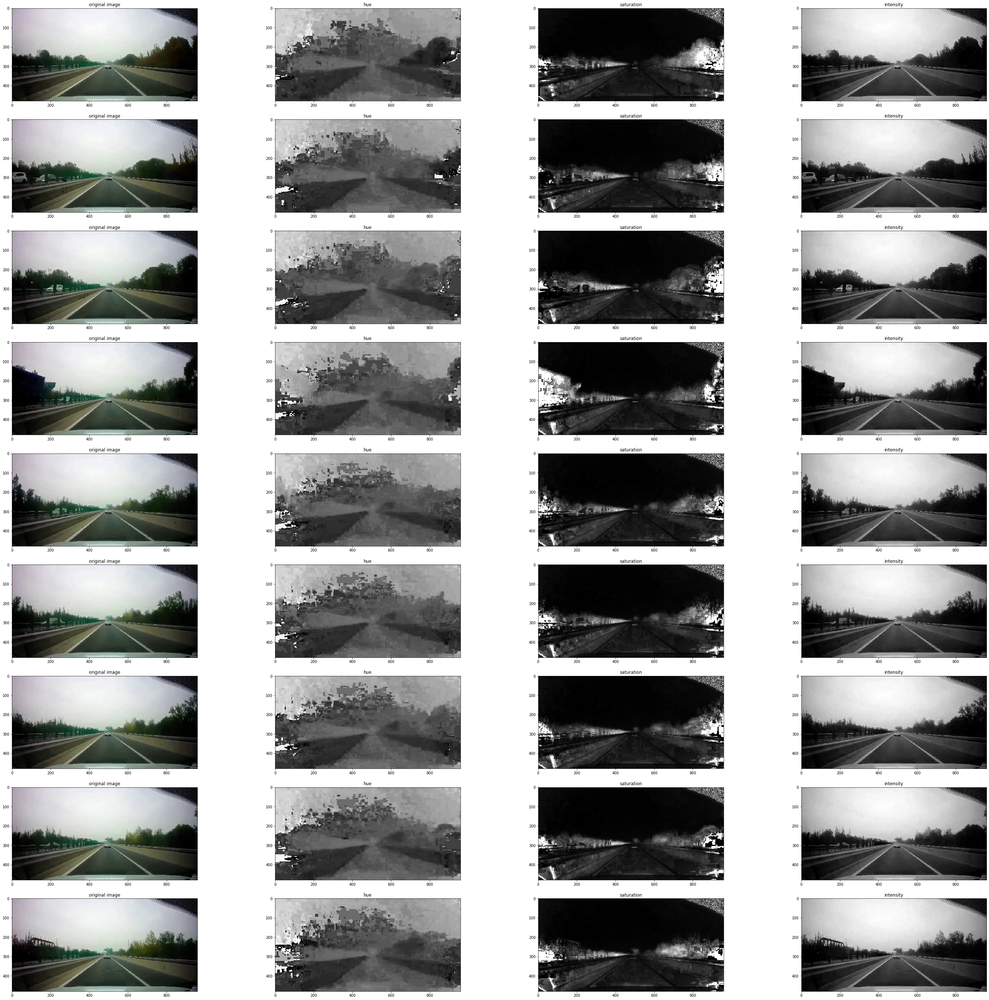

In [74]:
fig, axs = plt.subplots(number_of_images, 4)
fig.set_figheight(50)
fig.set_figwidth(50)
hsi_images = []
for img, ax in zip(test_images, axs):
    ax[0].imshow(img)
    ax[0].set_title("original image")
    hsi_img = np.apply_along_axis(rgb_to_hsi, -1, img)
    hsi_images.append(hsi_img)
    titles = ['hue', 'saturation', 'intensity']
    for i in range(1,4):
        ax[i].imshow(hsi_img[:,:,i-1], cmap='gray')
        ax[i].set_title(titles[i-1])

In [5]:
img = hsi_images[-1]
hue = img[:, :, 0]
sat = img[:, :, 1]
intensity = img[:,:,2]

white_lane_mask = np.bitwise_and((sat < white_color_saturation_threshold), (intensity > white_color_intensity_theshold))
yellow_lane_mask = np.bitwise_and((sat > yellow_color_saturation_threshold), (hue < yellow_color_hue_threshold))
mask = np.bitwise_or(white_lane_mask, yellow_lane_mask)
copied = np.copy(img)
copied[mask] = 1.
copied[~mask] = 0.

plt.imshow(copied, cmap='gray')

NameError: name 'white_color_saturation_threshold' is not defined

C:\Users\Raghod\AppData\Local\Continuum\anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: part1_output/00015.jpg is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\Raghod\AppData\Local\Continuum\anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: part1_output/00159.jpg is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\Raghod\AppData

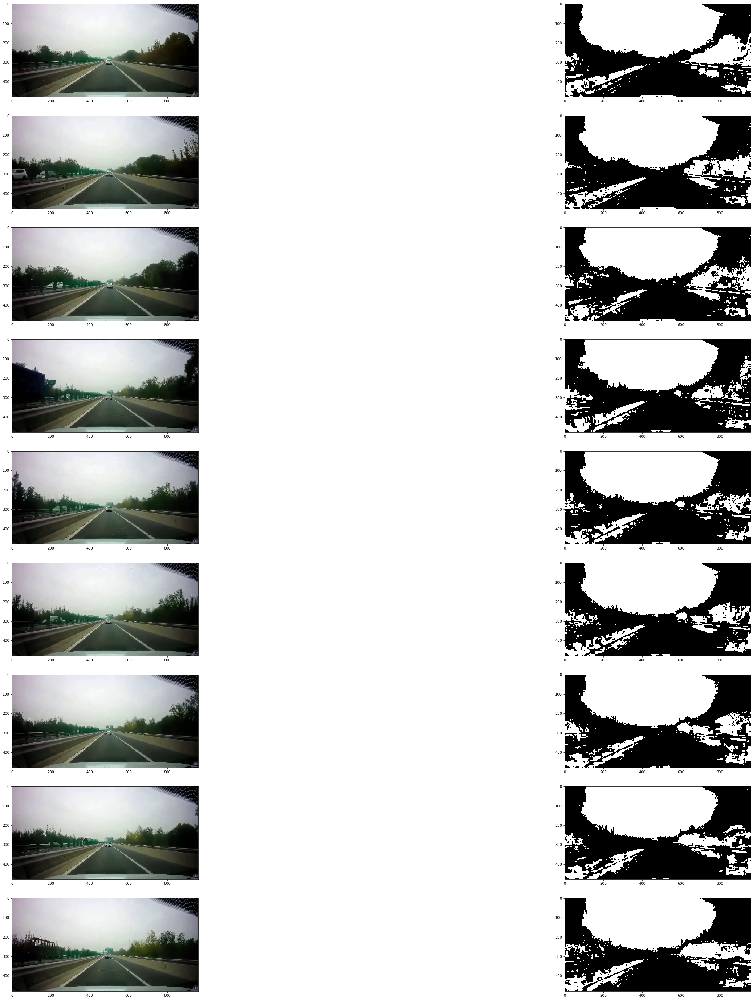

In [75]:

"""
White Lane Lines:
        higher values in intensity channel and low values in saturation channel
Yellow Lane Lines:
        higher values in saturation channel and low values in hue channel
"""

white_color_intensity_theshold = .75
# white_color_saturation_threshold = .05
white_color_saturation_threshold = .07

yellow_color_saturation_threshold = .2
yellow_color_hue_threshold = 2
fig, axs = plt.subplots(number_of_images, 2)
fig.set_figheight(50)
fig.set_figwidth(50)
count = 0
for idx, ax in enumerate(axs):
    #hsi = np.apply_along_axis(rgb_to_hsi, -1, img)
    img = hsi_images[idx]
    hue = img[:, :, 0]
    sat = img[:, :, 1]
    intensity = img[:,:,2]
    count = count + 1
    white_lane_mask = np.bitwise_and((sat < white_color_saturation_threshold), (intensity > white_color_intensity_theshold))
    yellow_lane_mask = np.bitwise_and((sat > yellow_color_saturation_threshold), (hue < yellow_color_hue_threshold))
    mask = np.bitwise_or(white_lane_mask, yellow_lane_mask)
    mask_img = np.where(mask == True ,1,0)
    imsave("part1_output/"+test_titles[idx],mask_img)
    copied = np.copy(img)
    copied[mask] = 1.
    copied[~mask] = 0.
    ax[0].imshow(test_images[idx])
    ax[1].imshow(copied, cmap='gray')

<h1 style="color:blue">Part (2) </h1>

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [76]:
def region_of_interest(img, vertices):
    mask = np.zeros_like(img)
    # channel_count = img.shape[2]
    match_mask_color = (255)
    cv2.fillPoly(mask, vertices, match_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def draw_lines(img, lines):
    img = np.copy(img)
    blank_image = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)

    for line in lines:
        for x1, y1, x2, y2 in line:
            if(abs(y1-y2)>40): # np.sqrt(np.sum([np.square(y2-y1),np.square(x2-x1)])) #Euclidean distance
                cv2.line(blank_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
    return img

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def threshold(img):
    image=rgb2gray(img)
    global_thresh = threshold_otsu(image)
    binary_global = image > global_thresh
    return binary_global

def sobel_H_V_angles(img):
    # gray_img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_BGR2GRAY)
    blur_img = gaussian_blur(img, 9)
    sobelx = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=1, dy=0) # Sobel on the X axis
    sobelx = abs(sobelx) + 1
    sobely = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=0, dy=1) # Sobel on the Y axis
    sobely = abs(sobely) + 1
    angles = abs(sobely/sobelx) #np.arctan
    return sobelx, sobely, angles

00012.jpg


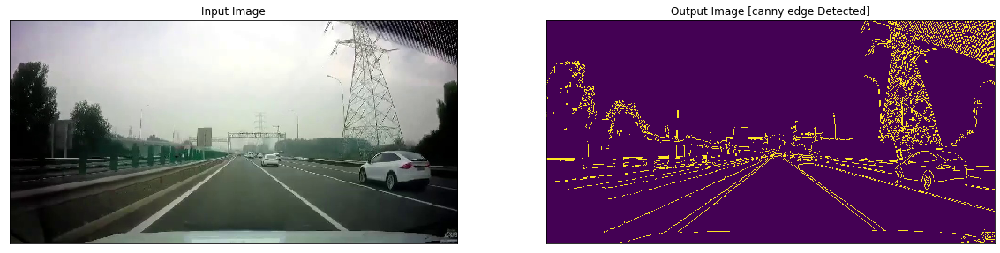

00045.jpg


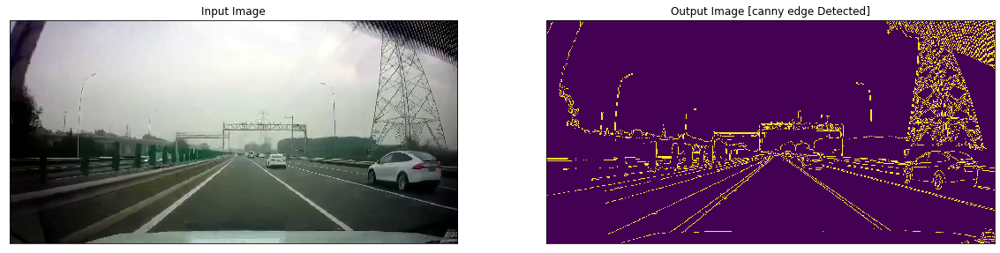

00060.jpg


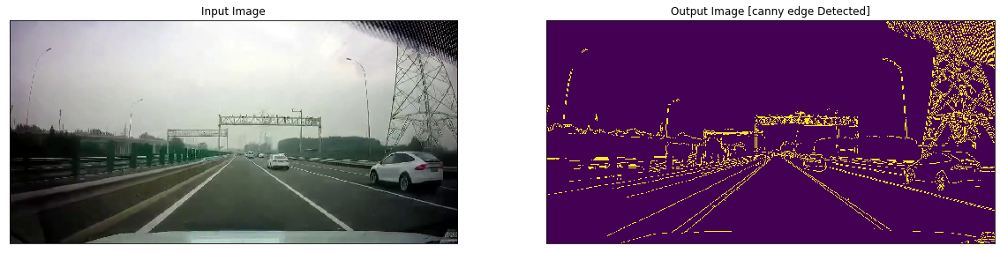

00075.jpg


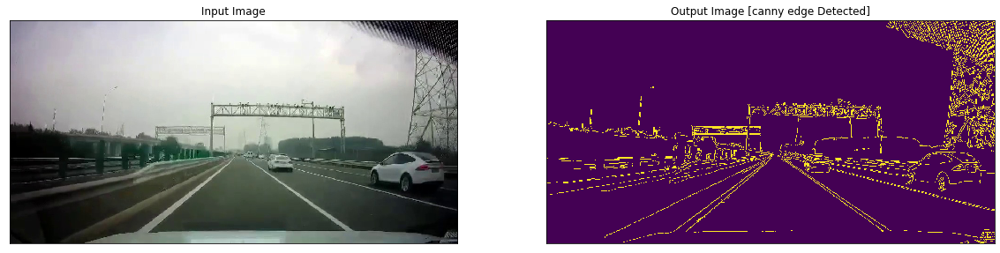

00108.jpg


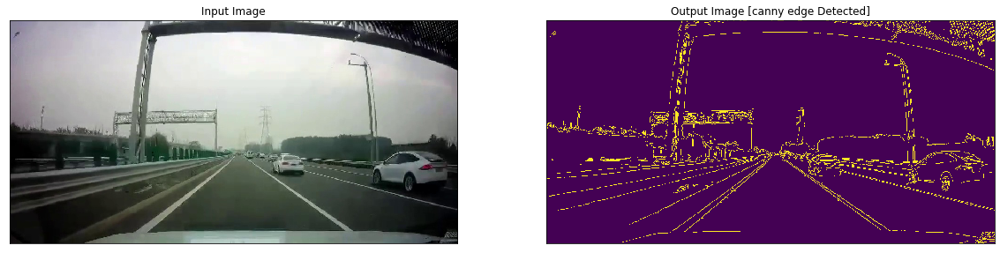

00177.jpg


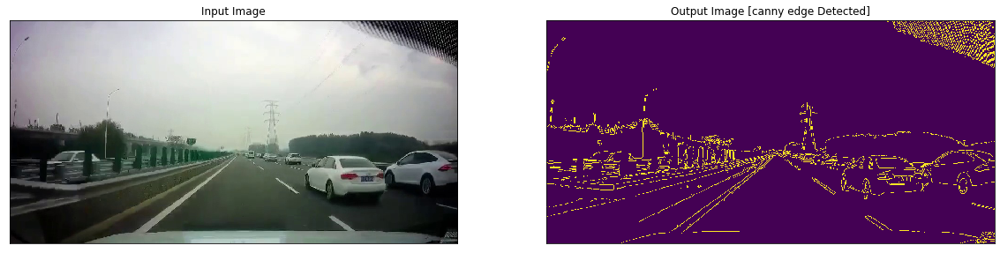

00195.jpg


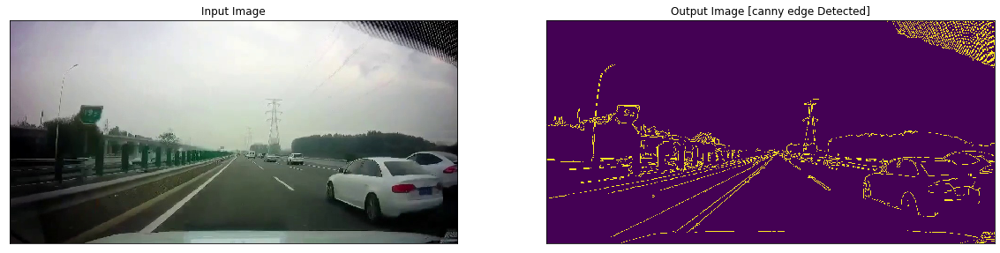

00210.jpg


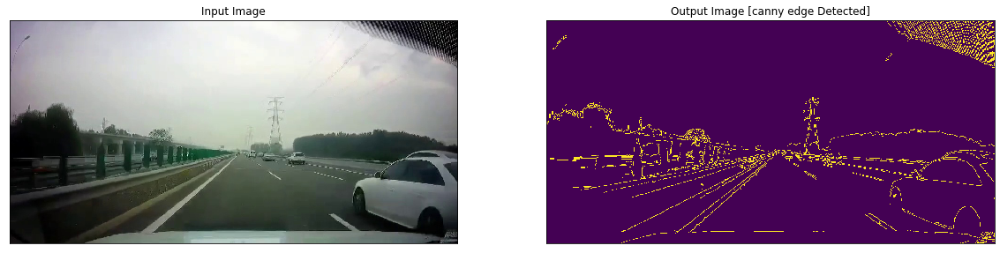

00246.jpg


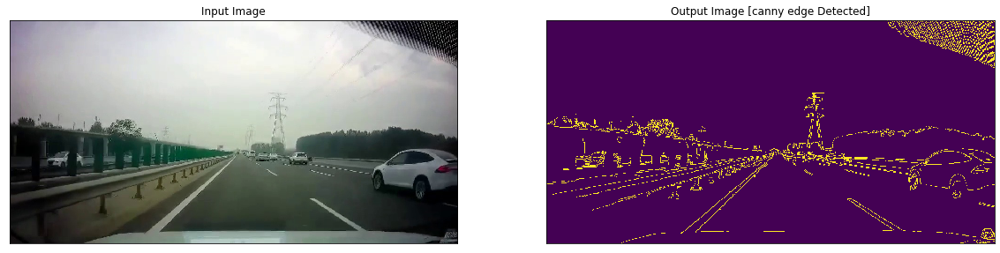

00252.jpg


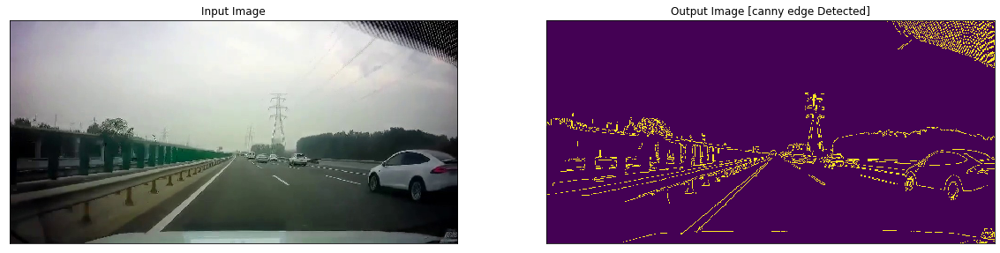

In [56]:

for image_path in list(os.listdir('./test_images')):
    print(image_path)
    fig = plt.figure(figsize=(20, 10))
    image = mpimg.imread(f'./test_images/{image_path}')
    ax = fig.add_subplot(1, 2, 1,xticks=[], yticks=[])
    plt.imshow(image)
    ax.set_title("Input Image")
    ax = fig.add_subplot(1, 2, 2,xticks=[], yticks=[])
    plt.imshow(cv2.Canny(image, 50, 200))
    ax.set_title("Output Image [canny edge Detected]")
    plt.show()

In [57]:
def textur_filtring_with_angles(image, edged_img, window_height, window_width, textur_threshold):
    result = np.copy(edged_img)
    half_height = window_height//2 # Y
    half_width = window_width//2 # X
    sobelx, sobely, angles = sobel_H_V_angles(image)
    # hist_var = []
    # print(angles)
    for i in range(half_height, result.shape[0] - half_height - 10):
        for j in range(half_width, result.shape[1] - half_width):
            # mean = np.average(angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)])
            # var = np.average((angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] - mean)**2)
            min_angle = np.min(angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)])
            max_angle = np.max(angles[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)])
            # hist_var = hist_var + [max_angle - min_angle]
            # print(max_angle - min_angle)
            # print(var)
            if(max_angle - min_angle > textur_threshold):
                result[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] = 0
    return result

def textur_filtring_with_magnitude(image, edged_img, window_height, window_width, textur_threshold):
    result = np.copy(edged_img)
    # result = np.copy(image)
    half_height = window_height//2 # Y
    half_width = window_width//2 # X
    for i in range(half_height, result.shape[0] - half_height - 10):
        for j in range(half_width, result.shape[1] - half_width):
            if(np.sum(edged_img[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] > 0) > textur_threshold):
                result[(i - half_height) : (i + half_height + 1), (j - half_width) : (j + half_width + 1)] = 0
    return result


00012.jpg
255
filtered_image_sum  5473
threshold  0.01187717013888889


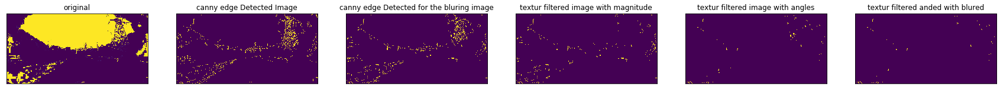

00015.jpg
255
filtered_image_sum  7166
threshold  0.015551215277777778


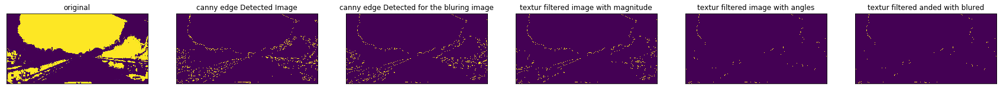

00045.jpg
255
filtered_image_sum  4050
threshold  0.0087890625


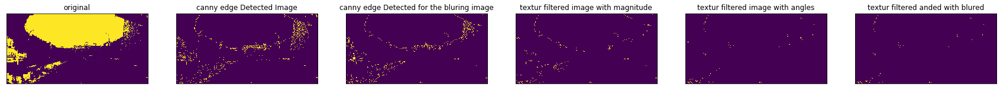

00060.jpg
255
filtered_image_sum  4013
threshold  0.00870876736111111


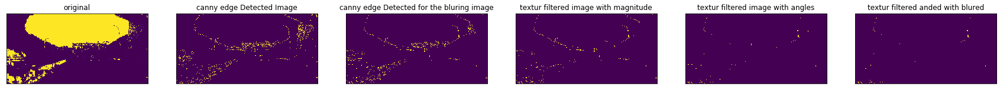

00075.jpg
255
filtered_image_sum  7038
threshold  0.0152734375


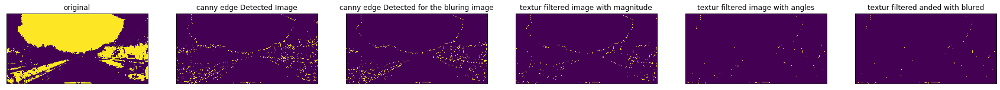

00105.jpg
255
filtered_image_sum  6992
threshold  0.015173611111111112


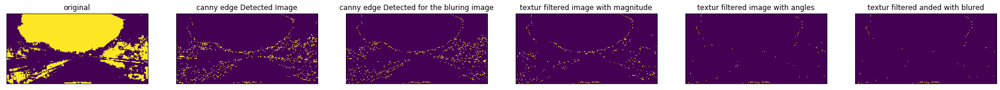

00108.jpg
255
filtered_image_sum  5411
threshold  0.011742621527777778


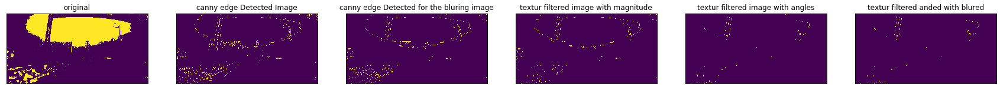

00159.jpg
255
filtered_image_sum  7341
threshold  0.015930989583333333


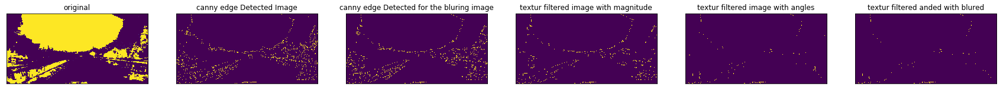

00177.jpg
255
filtered_image_sum  6819
threshold  0.014798177083333334


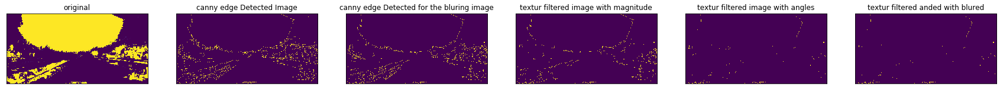

00189.jpg
255
filtered_image_sum  6404
threshold  0.013897569444444445


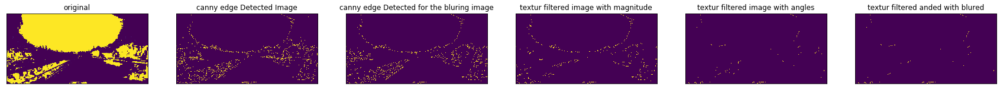

00195.jpg
255
filtered_image_sum  4056
threshold  0.008802083333333334


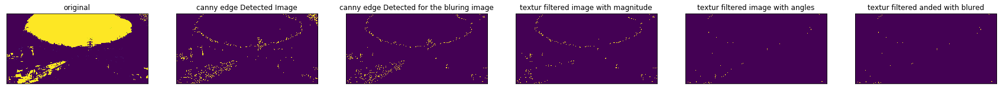

00201.jpg
255
filtered_image_sum  6078
threshold  0.013190104166666666


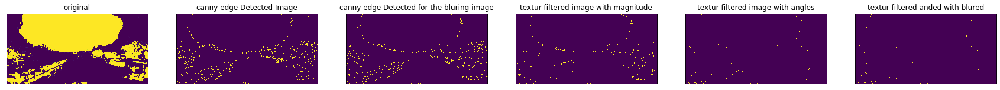

00210.jpg
255
filtered_image_sum  3535
threshold  0.007671440972222222


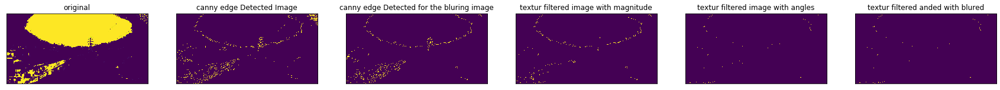

00219.jpg
255
filtered_image_sum  6150
threshold  0.013346354166666666


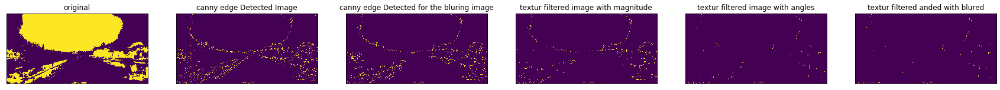

00246.jpg
255
filtered_image_sum  3940
threshold  0.008550347222222223


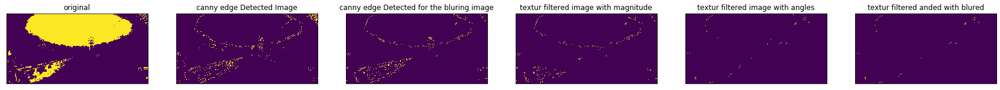

00249.jpg
255
filtered_image_sum  6444
threshold  0.013984375


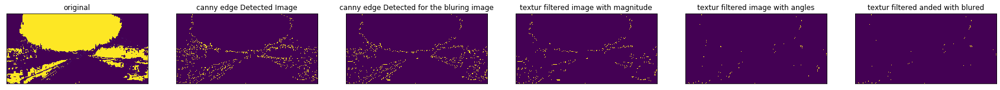

00252.jpg
255
filtered_image_sum  3708
threshold  0.008046875


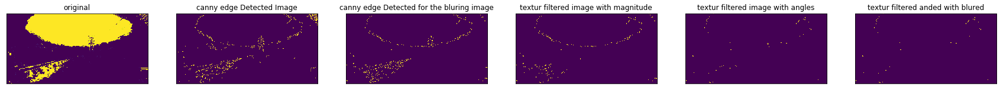

In [77]:
from skimage.filters import gaussian
from skimage.io import imsave, imread
import matplotlib.image as mpimg
count = 0
for image_path in list(os.listdir('./part1_output')):
    count = count + 1
    fig = plt.figure(figsize=(30, 10))
    image = mpimg.imread(f'./part1_output/{image_path}')
    print(image_path)
    ax = fig.add_subplot(1, 6, 1,xticks=[], yticks=[])
    plt.imshow(image)
    ax.set_title("original")
    # blur_img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edge = cv2.Canny(image, 50, 200, apertureSize=3)
    ax = fig.add_subplot(1, 6, 2,xticks=[], yticks=[])
    plt.imshow(edge)
    ax.set_title("canny edge Detected Image")
    ########################################################################
    blur_img = gaussian_blur(image, 9)
    # blur_img_gray = cv2.cvtColor(blur_img, cv2.COLOR_BGR2GRAY)
    blur_edged = cv2.Canny(blur_img, 100, 200, apertureSize=3)
    ax = fig.add_subplot(1, 6, 3,xticks=[], yticks=[])
    plt.imshow(blur_edged)
    ax.set_title("canny edge Detected for the bluring image")
    ########################################################################
    ax = fig.add_subplot(1, 6, 4,xticks=[], yticks=[])
    # filtered_image_with_magnitude = textur_filtring_with_magnitude(image, edge, 20, 40, 150) #try 200 or 150
    filtered_image_with_magnitude = textur_filtring_with_magnitude(image, blur_edged, 20, 40, 130) #try 200 or 150
    plt.imshow(filtered_image_with_magnitude)
    ax.set_title("textur filtered image with magnitude")
    ################################ Weighted sum  ########################
    print(filtered_image_with_magnitude.max())
    filtered_image_magnitude_sum = np.sum(filtered_image_with_magnitude//255)
    print("filtered_image_sum ",filtered_image_magnitude_sum)
    threshold = (filtered_image_magnitude_sum/(image.shape[0]*image.shape[1]))
    print("threshold ",threshold)
    ########################################################################
    
    ax = fig.add_subplot(1, 6, 5,xticks=[], yticks=[])
    # num_of_edges = np.sum(edge/255 != 0)
    # mean = num_of_edges / (edge.shape[0]*edge.shape[1])
    filtered_image_with_angles = textur_filtring_with_angles(image, blur_edged, 10, 10, 40) #try 200 or 150
    plt.imshow(filtered_image_with_angles)
    ax.set_title("textur filtered image with angles")
    ########################################################################
    ax = fig.add_subplot(1, 6, 6,xticks=[], yticks=[])
    filter_and_blur = filtered_image_with_magnitude & filtered_image_with_angles & blur_edged
    plt.imshow(filter_and_blur)
    ax.set_title("textur filtered anded with blured")
    plt.show()

    # if (threshold > 0.2):
    imsave("part2_output/"+image_path,filtered_image_with_magnitude)
        # print("anded")
    # else :
    #     imsave(image_path,filtered_image_with_magnitude)
    #     print("magnitude")
        
    # plt.figure()
    # plt.hist(var_hist, bins=range(0,len(var_hist)))
    # print(var_hist)
    

In [65]:
def weighted_img(img, initial_img, α=0.1, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    lines_edges = cv2.addWeighted(initial_img, α, img, β, γ)
    #lines_edges = cv2.polylines(lines_edges,get_vertices(img), True, (0,0,255), 10)
    return lines_edges

In [67]:
def slope_lines(image,lines):
    
    img = image.copy()
    poly_vertices = []
    order = [0,1,3,2]

    left_lines = [] # Like /
    right_lines = [] # Like \
    for line in lines:
        for x1,y1,x2,y2 in line:

            if x1 == x2:
                pass #Vertical Lines
            else:
                m = (y2 - y1) / (x2 - x1)
                c = y1 - m * x1

                if m < 0:
                    left_lines.append((m,c))
                elif m >= 0:
                    right_lines.append((m,c))

    left_line = np.mean(left_lines, axis=0)
    right_line = np.mean(right_lines, axis=0)

    #print(left_line, right_line)

    for slope, intercept in [left_line, right_line]:

        #getting complete height of image in y1
        rows, cols = image.shape[:2]
        y1= int(rows) #image.shape[0]

        #taking y2 upto 60% of actual height or 60% of y1
        y2= int(rows*0.6) #int(0.6*y1)

        #we know that equation of line is y=mx +c so we can write it x=(y-c)/m
        x1=int((y1-intercept)/slope)
        x2=int((y2-intercept)/slope)
        poly_vertices.append((x1, y1))
        poly_vertices.append((x2, y2))
        draw_lines(img, np.array([[[x1,y1,x2,y2]]]))
    
    poly_vertices = [poly_vertices[i] for i in order]
    cv2.fillPoly(img, pts = np.array([poly_vertices],'int32'), color = (0,255,0))
    return cv2.addWeighted(image,0.7,img,0.4,0.)

In [61]:
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    #draw_lines(line_img, lines)
    line_img = slope_lines(line_img,lines)
    return line_img


In [45]:
def draw_lines(img, lines):
    img = np.copy(img)
    blank_image = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)

    for line in lines:
        for x1, y1, x2, y2 in line:
           
            # result = np.sqrt((y2-y1)**2 + (x2-x1)**2)
            if(abs(y2-y1) > 20):
               cv2.line(blank_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
    return img


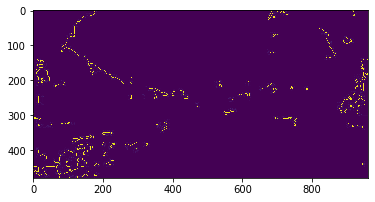

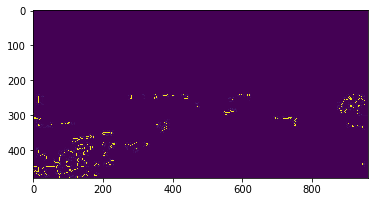

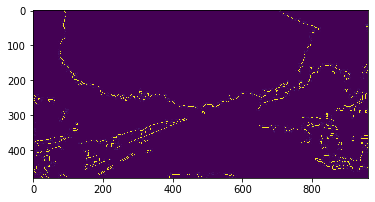

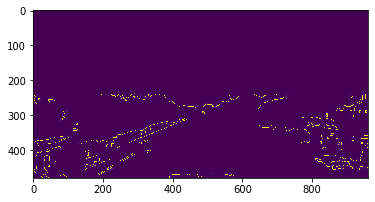

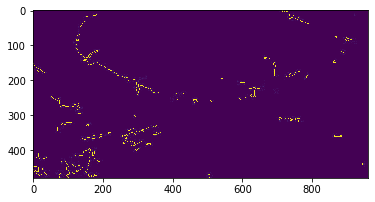

...

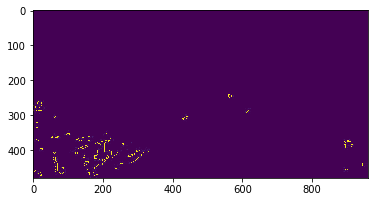

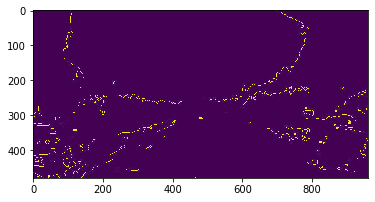

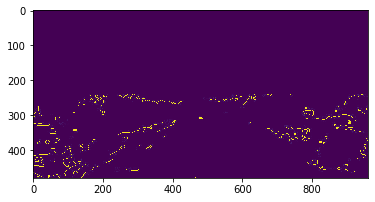

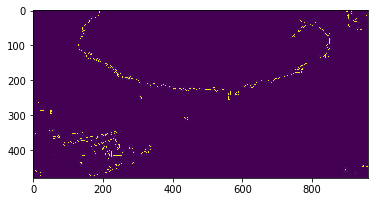

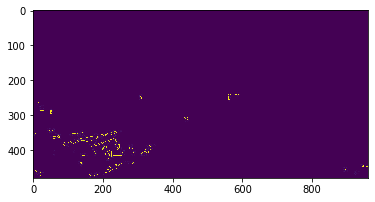

In [80]:
for image_path in list(os.listdir('./part2_output')):
    original = mpimg.imread(f'./part2_output/{image_path}')
    
    image = np.copy(original)
    plt.imshow(original)
    plt.show()

    image_cropped_lower = image[int(image.shape[0]/2):]

    image[:int(image.shape[0]/2)] = 0
    image_cropped_upper = image[:int(image.shape[0]/2)]

    combined = np.block([[image_cropped_upper],[image_cropped_lower]])
    imsave("after_Crop_output/"+ image_path,combined)
    plt.imshow(combined)
    plt.show()

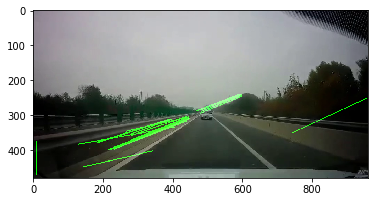

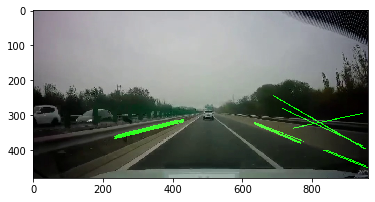

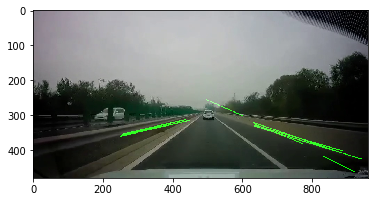

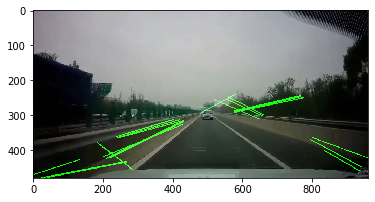

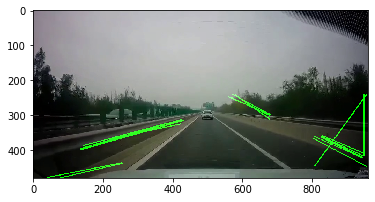

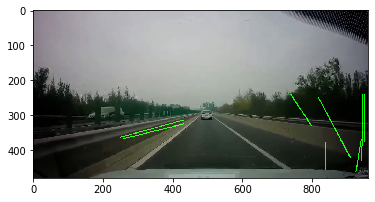

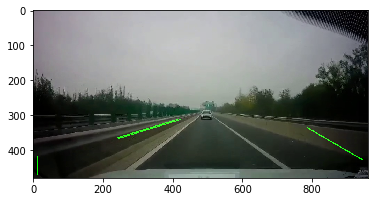

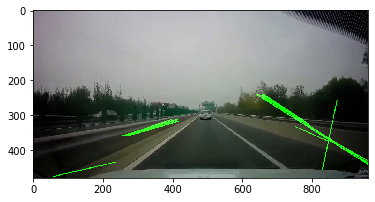

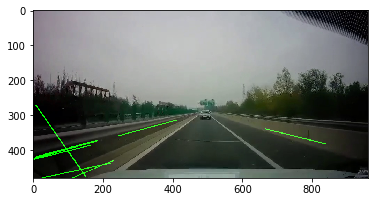

In [82]:
for image_path in list(os.listdir('./after_Crop_output')):
        combined = mpimg.imread(f'./after_Crop_output/{image_path}')
        original = mpimg.imread(f'./test_images/{image_path}')
        output = np.copy(original)
        # houghed_lines = hough_lines(img = filter_and_blur, rho = 1, theta = np.pi/180, threshold = 20, min_line_len = 20, max_line_gap = 180)
        houghed_lines = cv2.HoughLinesP(combined, rho=2, theta=np.pi/180,
                            threshold=120, lines=np.array([]), minLineLength=10, maxLineGap=30)
        output = draw_lines(original, houghed_lines)
        # #Draw lines on edges
        # output = weighted_img(img = houghed_lines, initial_img = image, α=0.8, β=1., γ=0.)
        imsave("Resultset5/"+ image_path,output)
        plt.imshow(output)
        plt.show()